Mounted at /content/drive


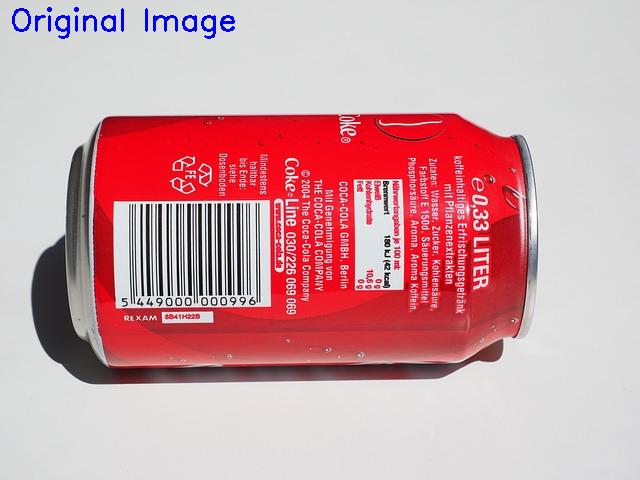

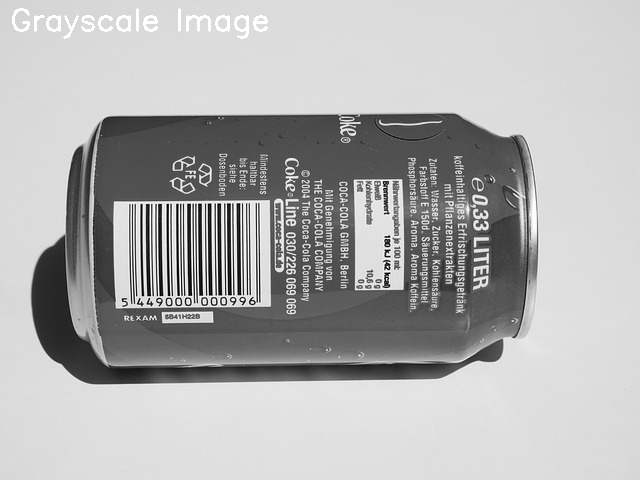

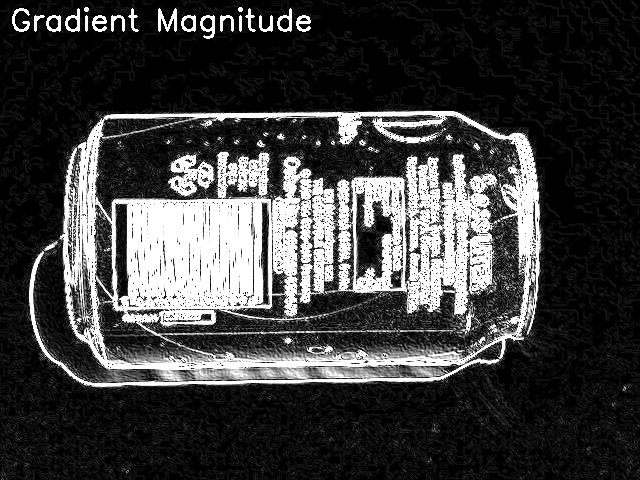

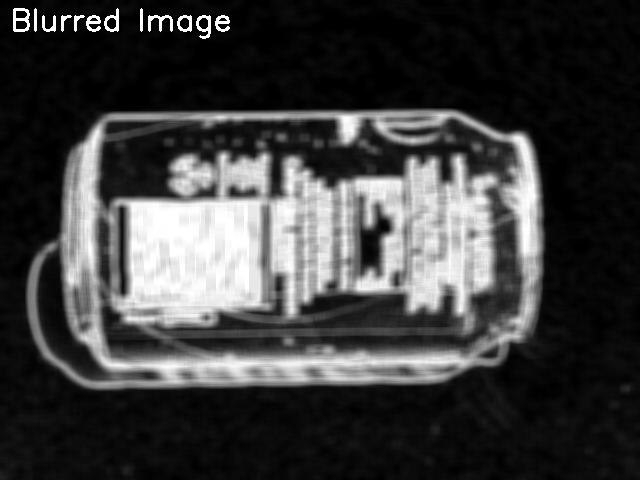

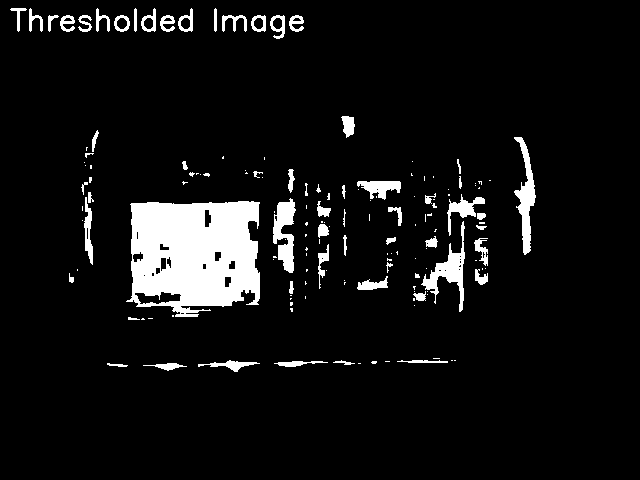

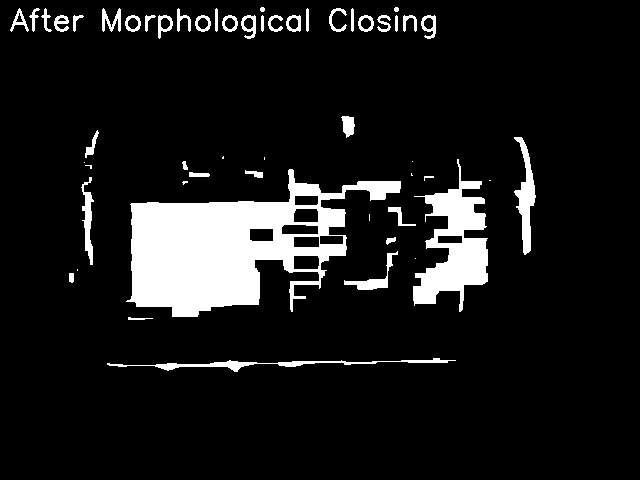

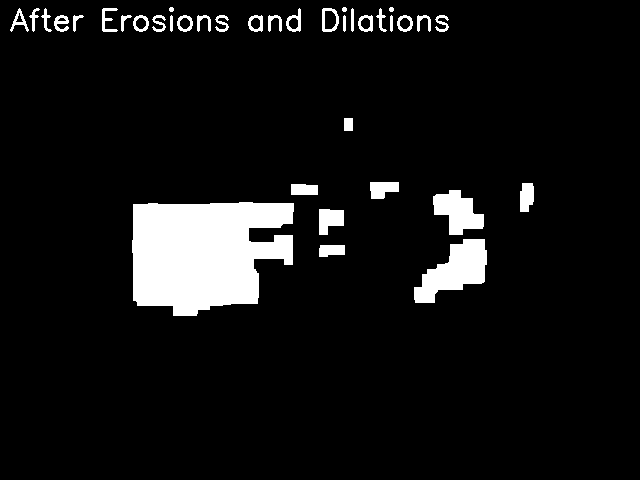

<ipython-input-1-ab086d9bd4ce>:59: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)


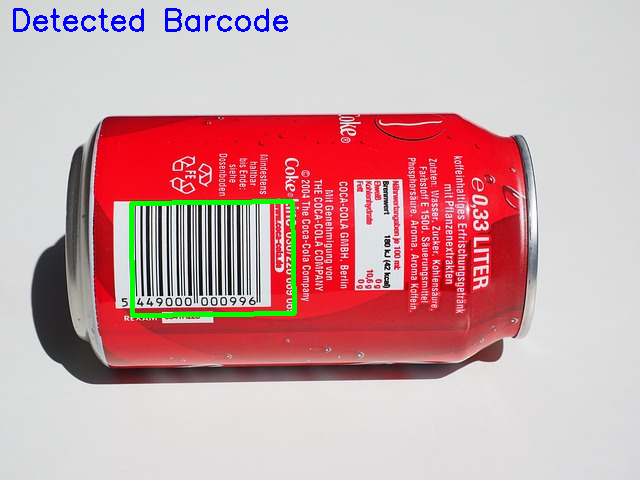

In [ ]:
# Import the necessary packages
from google.colab import drive
drive.mount('/content/drive')
import numpy as np
import imutils
import cv2
from google.colab.patches import cv2_imshow

def display_image_with_title(image, title):
    # Display an image with a title written on it
    output = image.copy()
    cv2.putText(output, title, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    cv2_imshow(output)

# Load the image and convert it to grayscale
image_path = "/content/drive/MyDrive/DIP project/can-592368_640.jpg"
image = cv2.imread(image_path)
display_image_with_title(image, "Original Image")
if image is None:
    print("Error: Image not found.")
else:
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    display_image_with_title(gray, "Grayscale Image")

    # Compute the Scharr gradient magnitude representation of the images
    ddepth = cv2.cv.CV_32F if imutils.is_cv2() else cv2.CV_32F
    gradX = cv2.Sobel(gray, ddepth=ddepth, dx=1, dy=0, ksize=-1)
    gradY = cv2.Sobel(gray, ddepth=ddepth, dx=0, dy=1, ksize=-1)

    # Subtract the y-gradient from the x-gradient
    gradient = cv2.subtract(gradX, gradY)
    gradient = cv2.convertScaleAbs(gradient)
    display_image_with_title(gradient, "Gradient Magnitude")

    # Blur and threshold the image
    blurred = cv2.blur(gradient, (10, 8))
    display_image_with_title(blurred, "Blurred Image")
    _, thresh = cv2.threshold(blurred, 225, 255, cv2.THRESH_BINARY)
    display_image_with_title(thresh, "Thresholded Image")

    # Construct a closing kernel and apply it to the thresholded image
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (21, 7))
    closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
    display_image_with_title(closed, "After Morphological Closing")

    # Perform a series of erosions and dilations
    closed = cv2.erode(closed, None, iterations=5)
    closed = cv2.dilate(closed, None, iterations=4)
    display_image_with_title(closed, "After Erosions and Dilations")

    # Find the contours in the thresholded image, then sort the contours
    cnts = cv2.findContours(closed.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = sorted(cnts, key=cv2.contourArea, reverse=True)[0]

    # Compute the rotated bounding box of the largest contour
    rect = cv2.minAreaRect(c)
    box = cv2.cv.BoxPoints(rect) if imutils.is_cv2() else cv2.boxPoints(rect)
    box = np.int0(box)

    # Draw a bounding box around the detected barcode and display the image
    cv2.drawContours(image, [box], 0, (0, 255, 0), 3)
    display_image_with_title(image, "Detected Barcode")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Processing barcode_05.jpg

### Original Image

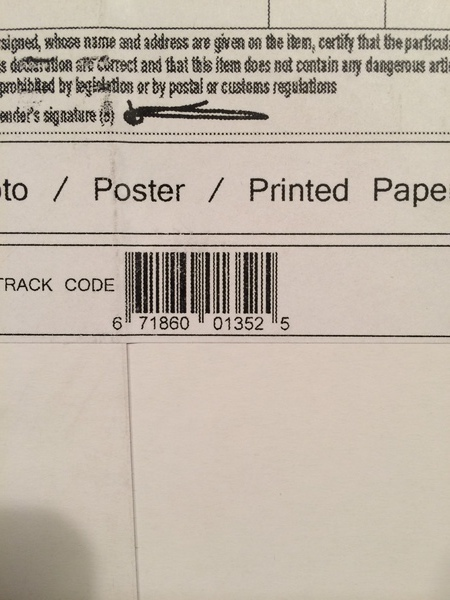

### Grayscale Image

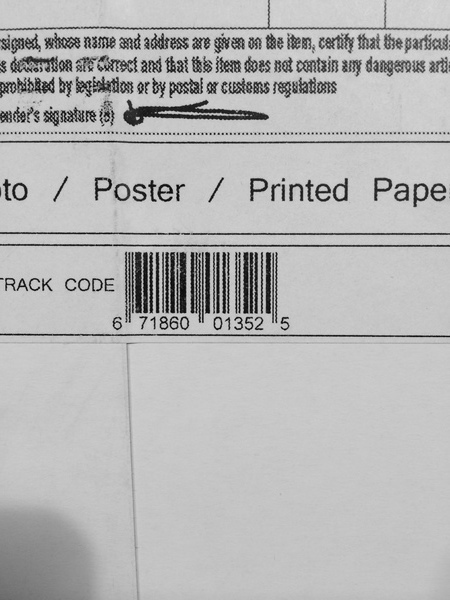

### Gradient Magnitude

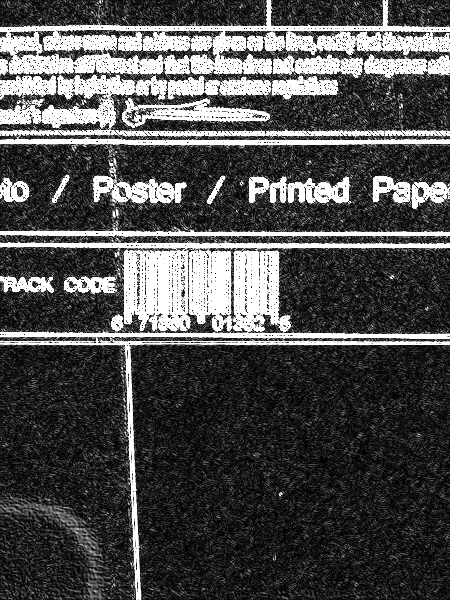

### Blurred and Thresholded Image

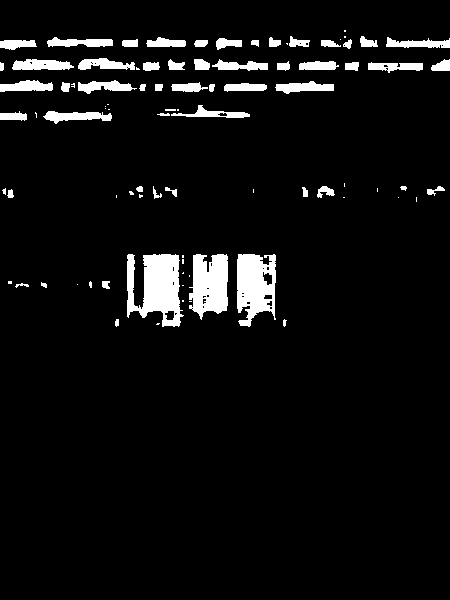

### After Erosions and Dilations

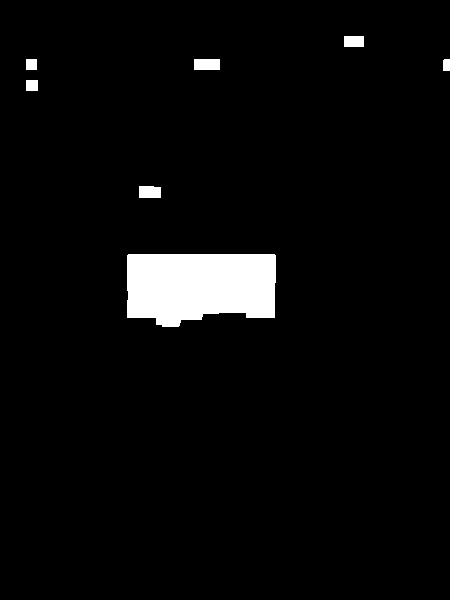

<ipython-input-2-8c2aab69857b>:59: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)


### Detected Barcode

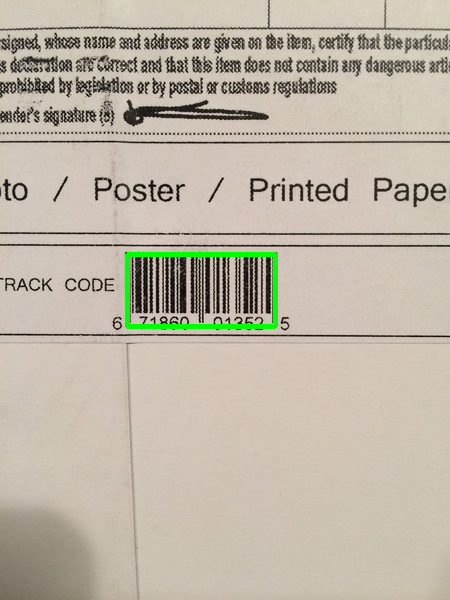

## Processing barcode_03.jpg

### Original Image

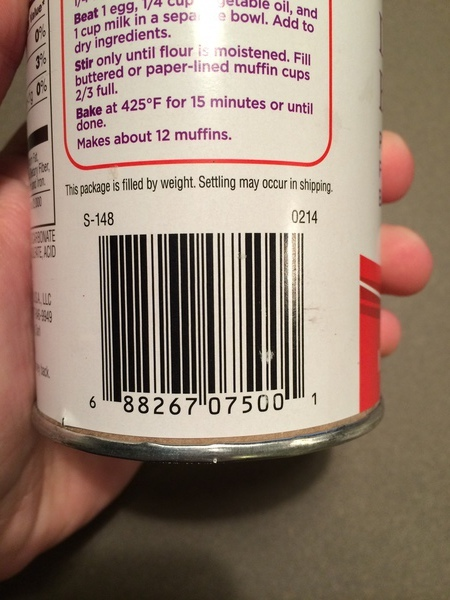

### Grayscale Image

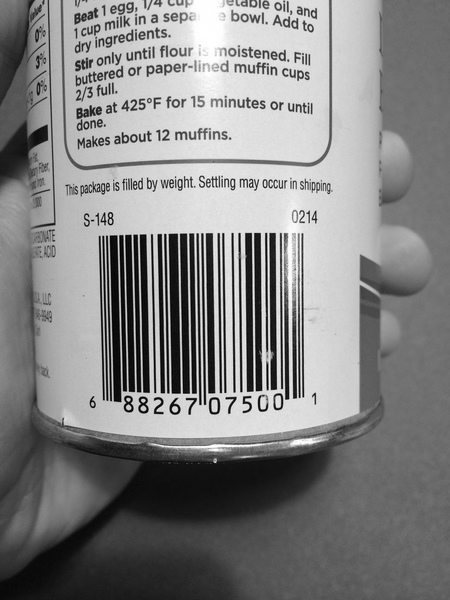

### Gradient Magnitude

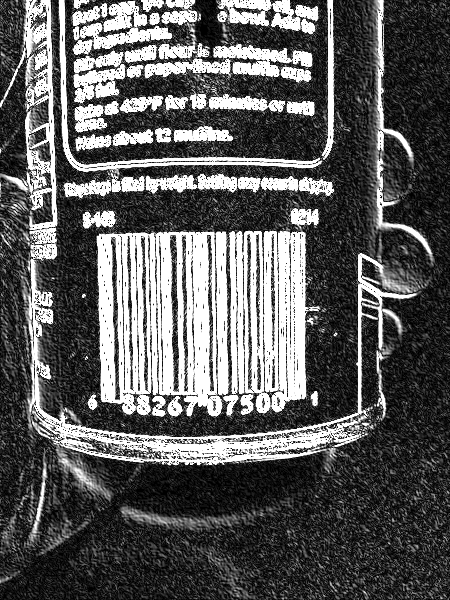

### Blurred and Thresholded Image

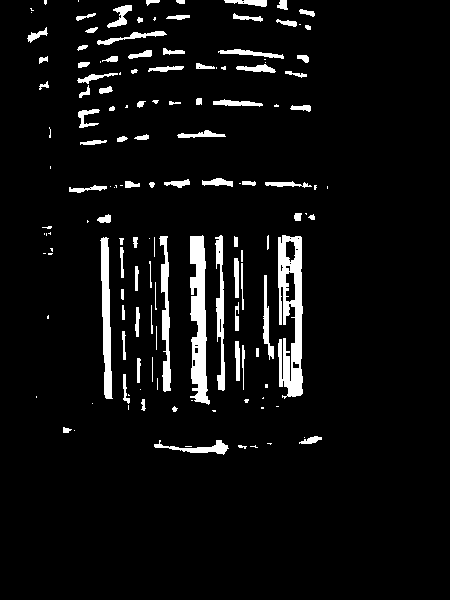

### After Erosions and Dilations

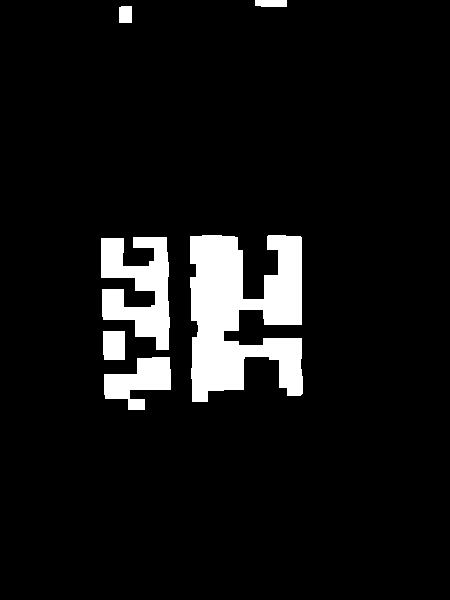

### Detected Barcode

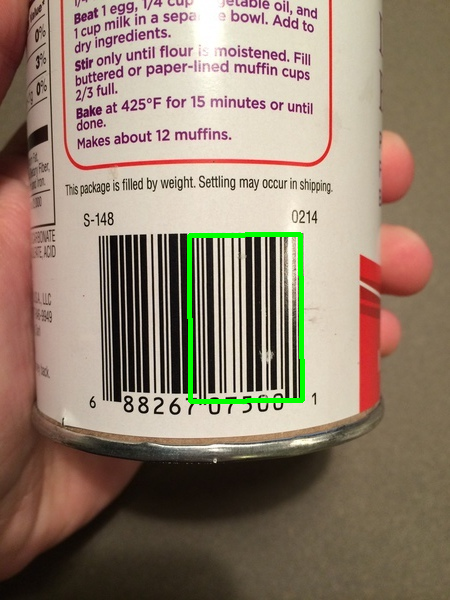

## Processing barcode_02.jpg

### Original Image

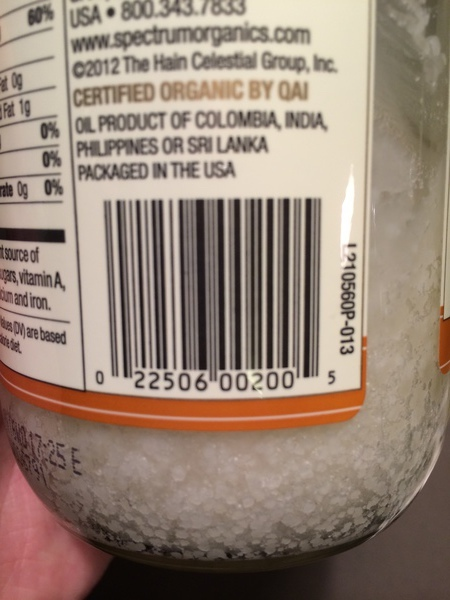

### Grayscale Image

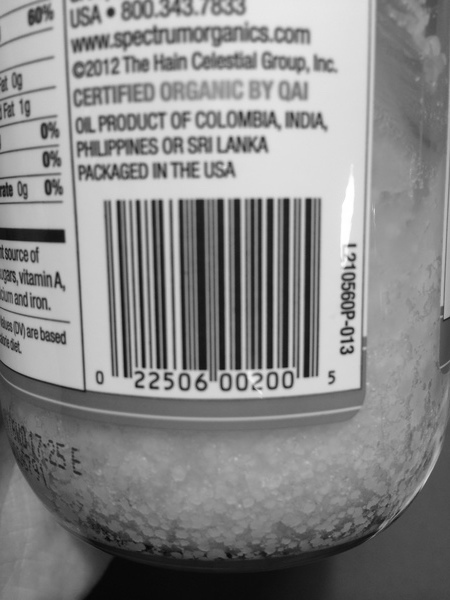

### Gradient Magnitude

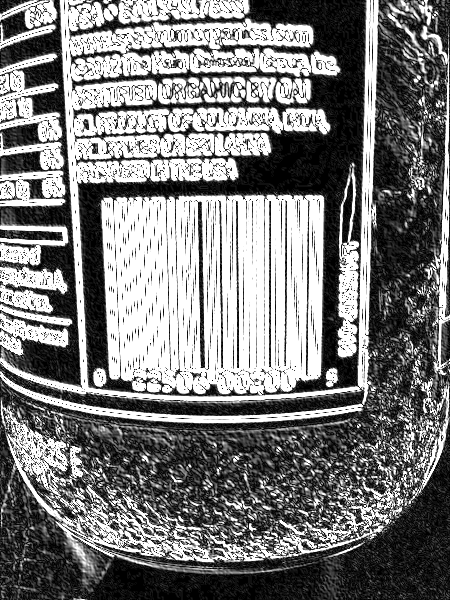

### Blurred and Thresholded Image

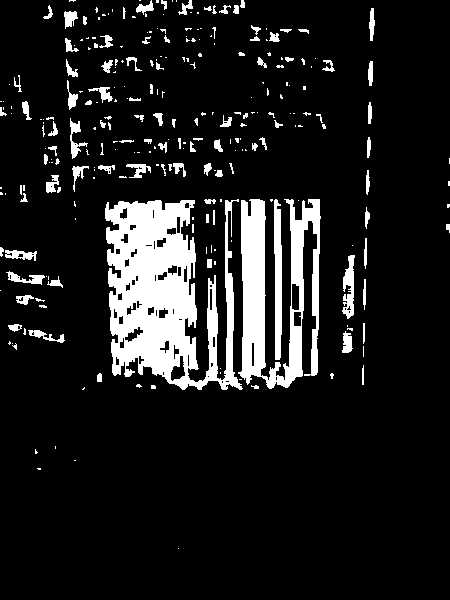

### After Erosions and Dilations

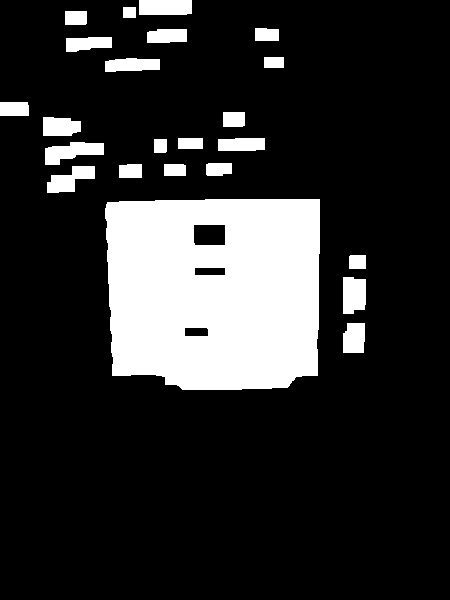

### Detected Barcode

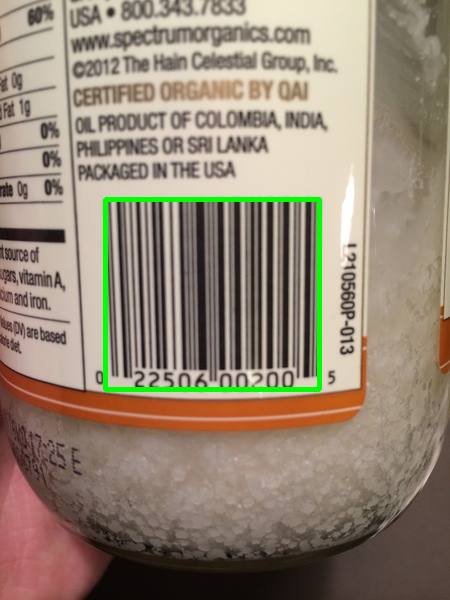

## Processing barcode_01.jpg

### Original Image

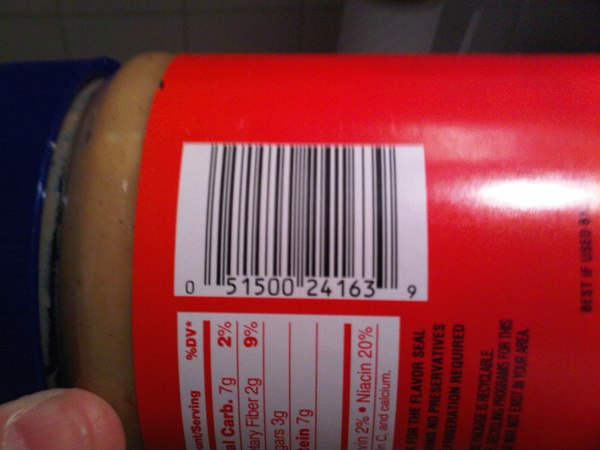

### Grayscale Image

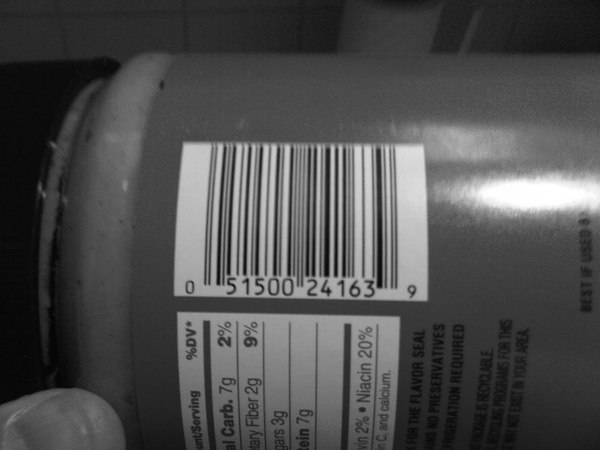

### Gradient Magnitude

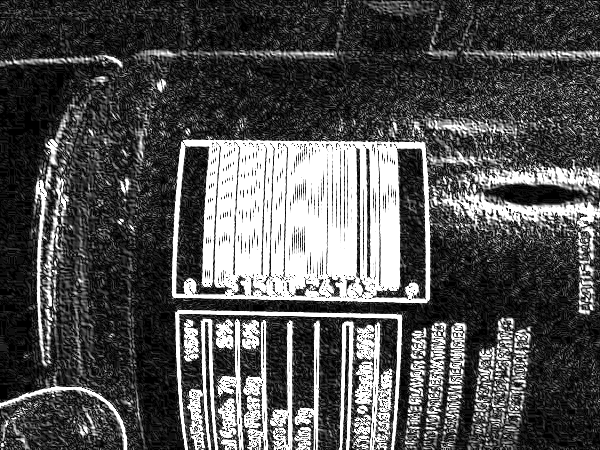

### Blurred and Thresholded Image

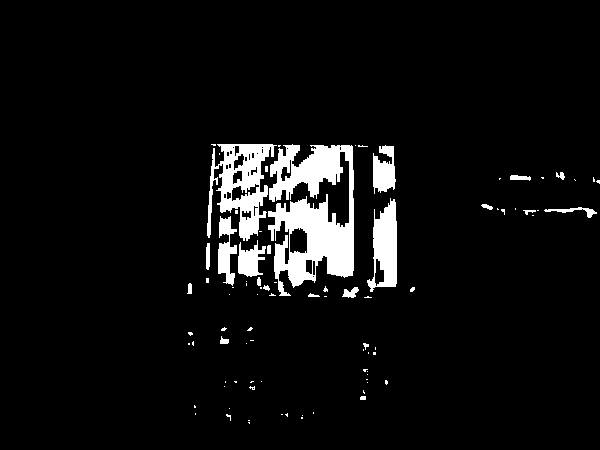

### After Erosions and Dilations

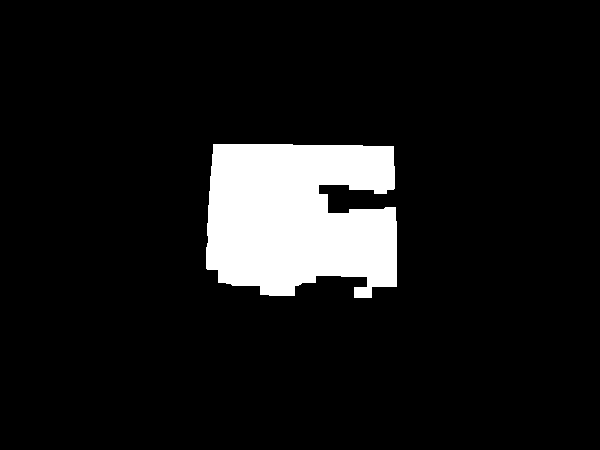

### Detected Barcode

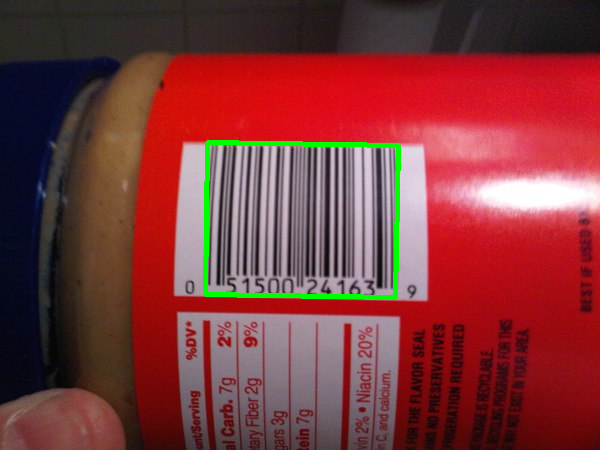

## Processing barcode_06.jpg

### Original Image

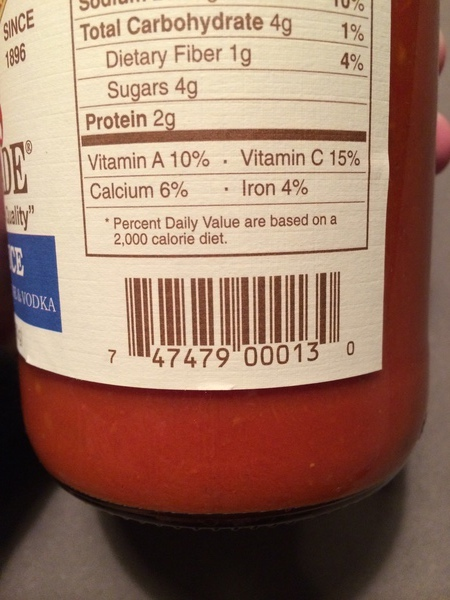

### Grayscale Image

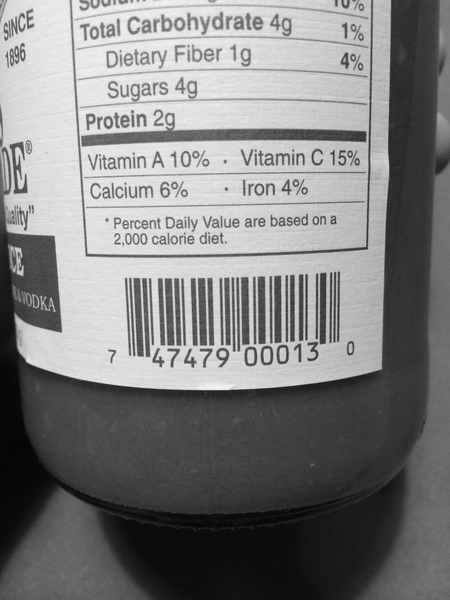

### Gradient Magnitude

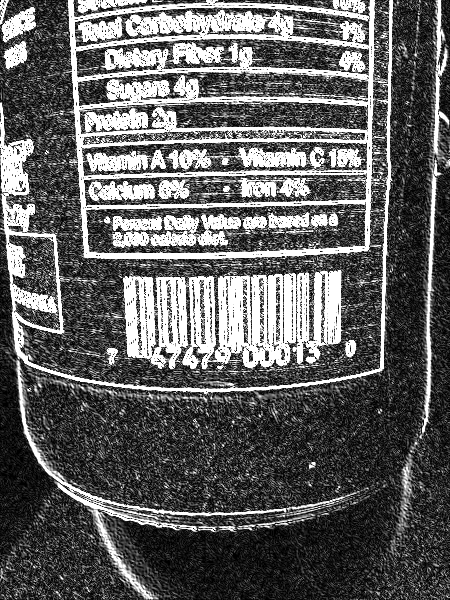

### Blurred and Thresholded Image

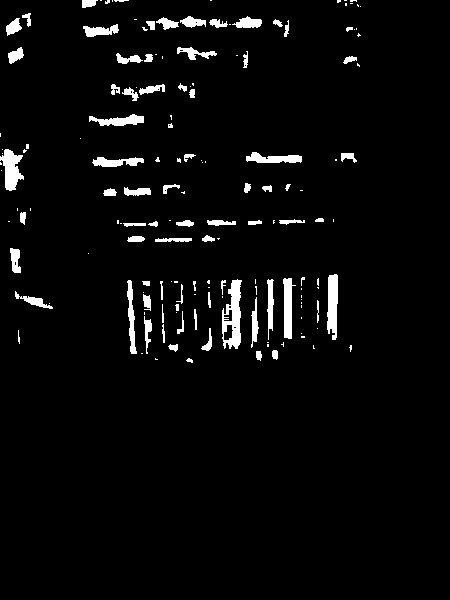

### After Erosions and Dilations

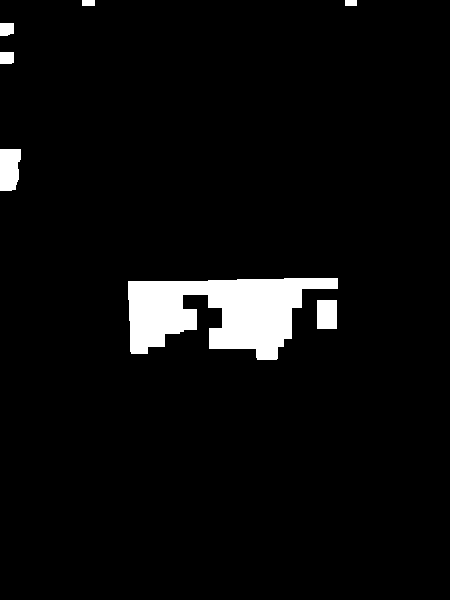

### Detected Barcode

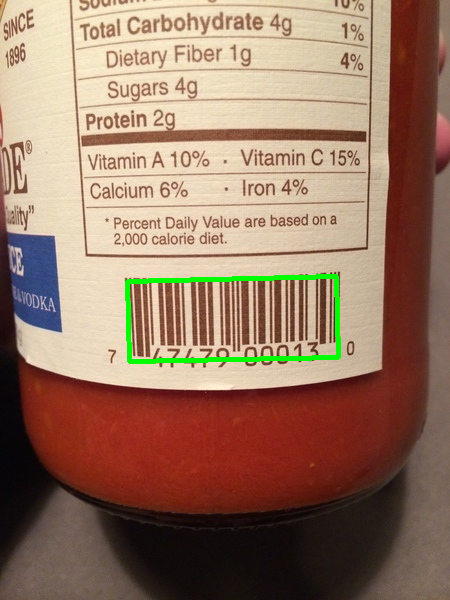

## Processing barcode_04.jpg

### Original Image

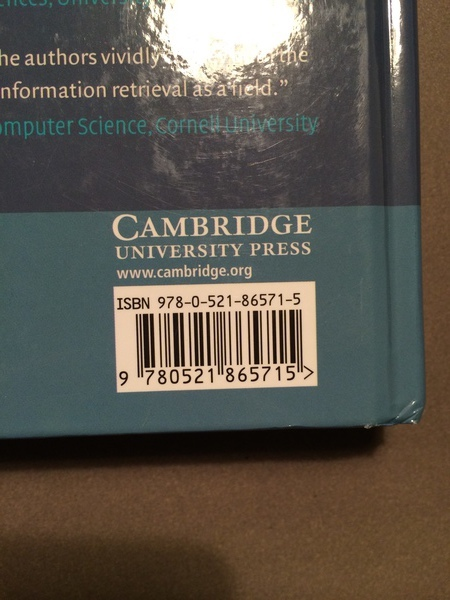

### Grayscale Image

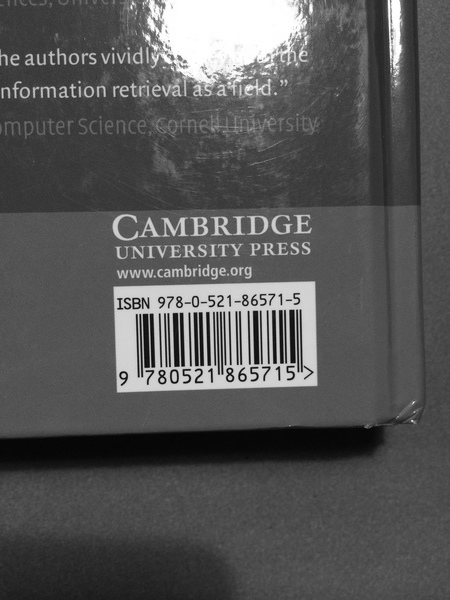

### Gradient Magnitude

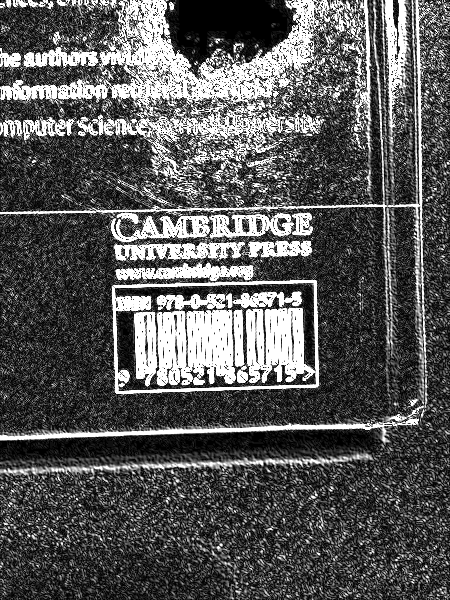

### Blurred and Thresholded Image

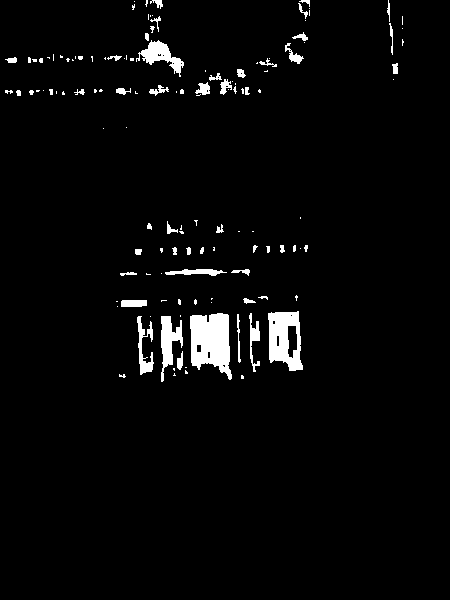

### After Erosions and Dilations

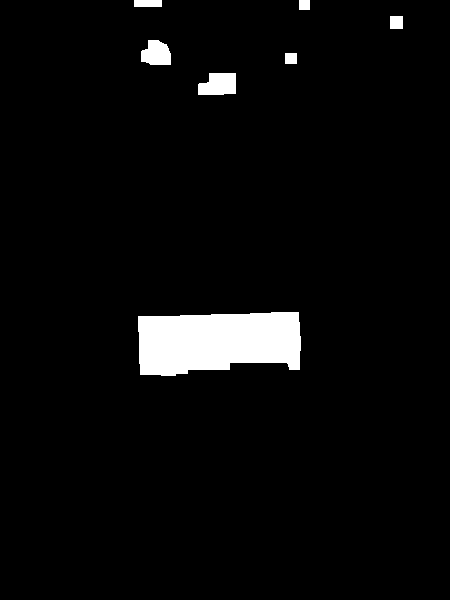

### Detected Barcode

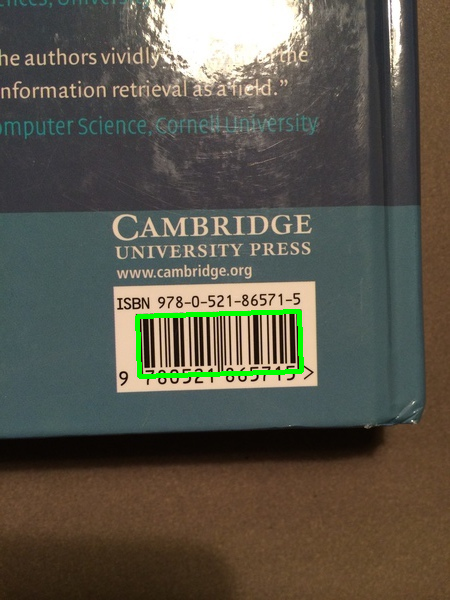

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import numpy as np
import imutils
import cv2
import os
from google.colab.patches import cv2_imshow
from IPython.display import display, Markdown

# Define the path to the dataset
dataset_path = "/content/drive/MyDrive/DIP project/images"

# List all images in the dataset folder
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.png', '.jpg', '.jpeg'))]

def process_image(image_path):
    # Load the image and convert it to grayscale
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Image not found at {image_path}.")
        return
    display_with_title("Original Image", image)

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    display_with_title("Grayscale Image", gray)

    # Compute gradients
    ddepth = cv2.CV_32F
    gradX = cv2.Sobel(gray, ddepth=ddepth, dx=1, dy=0, ksize=-1)
    gradY = cv2.Sobel(gray, ddepth=ddepth, dx=0, dy=1, ksize=-1)

    # Subtract the y-gradient from the x-gradient
    gradient = cv2.subtract(gradX, gradY)
    gradient = cv2.convertScaleAbs(gradient)
    display_with_title("Gradient Magnitude", gradient)

    # Blur and threshold the image
    blurred = cv2.blur(gradient, (9, 9))
    _, thresh = cv2.threshold(blurred, 225, 255, cv2.THRESH_BINARY)
    display_with_title("Blurred and Thresholded Image", thresh)

    # Morphological operations
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (21, 7))
    closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)


    # Perform a series of erosions and dilations
    closed = cv2.erode(closed, None, iterations=5)
    closed = cv2.dilate(closed, None, iterations=5)
    display_with_title("After Erosions and Dilations", closed)

    # Contour detection
    cnts = cv2.findContours(closed.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    if cnts:
        c = sorted(cnts, key=cv2.contourArea, reverse=True)[0]
        rect = cv2.minAreaRect(c)
        box = cv2.boxPoints(rect)
        box = np.int0(box)
        cv2.drawContours(image, [box], 0, (0, 255, 0), 3)
    display_with_title("Detected Barcode", image)

def display_with_title(title, img):
    display(Markdown(f"### {title}"))
    cv2_imshow(img)

# Process each image in the dataset
for image_file in image_files:
    display(Markdown(f"## Processing {image_file}"))
    process_image(os.path.join(dataset_path, image_file))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


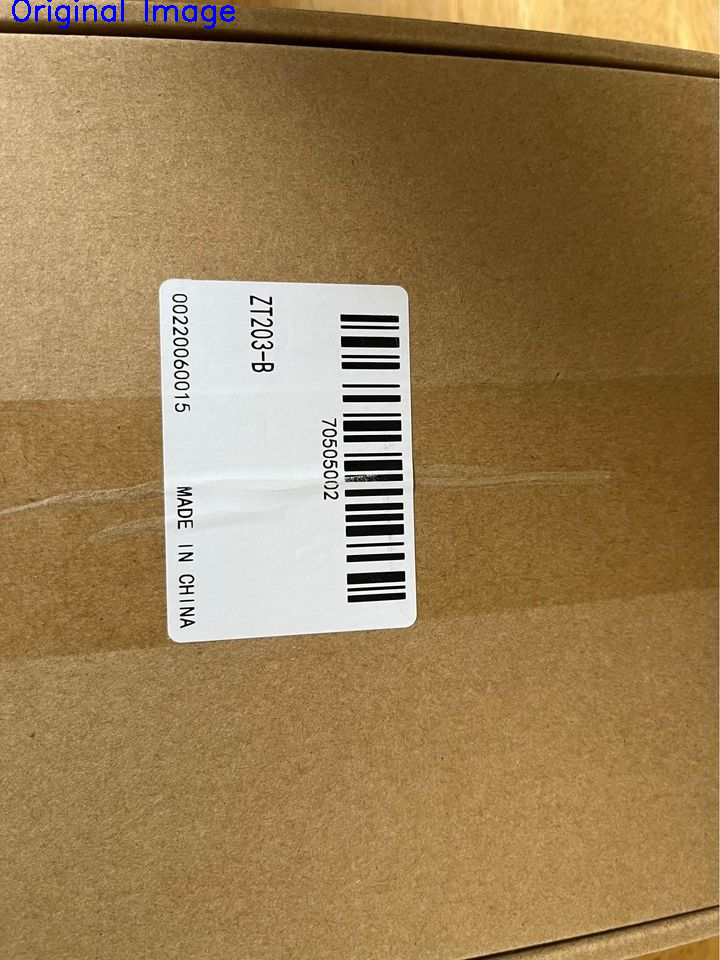

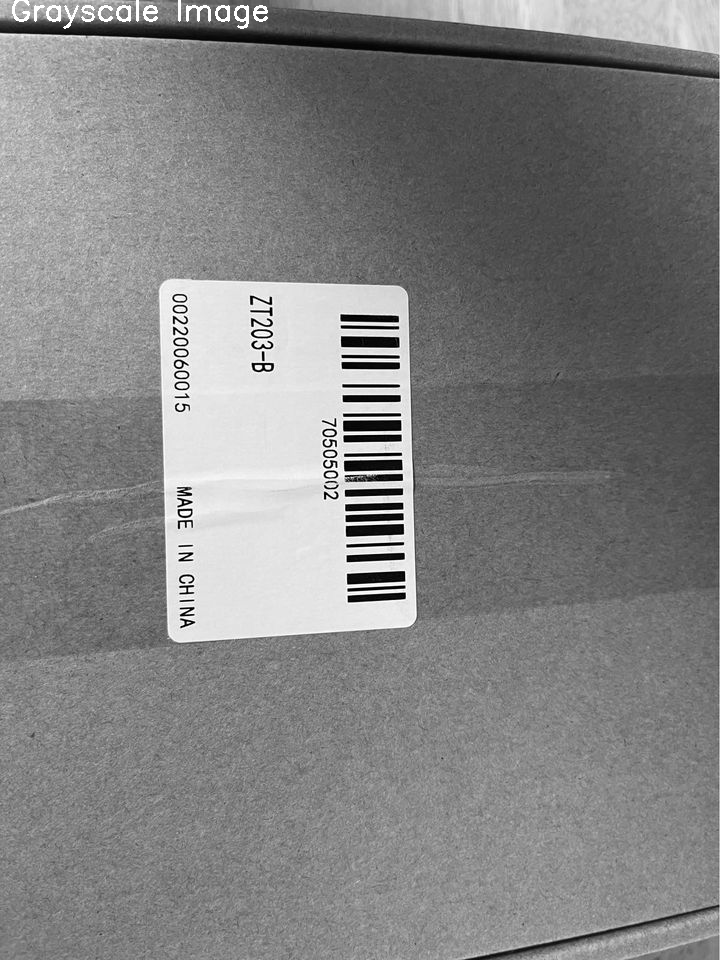

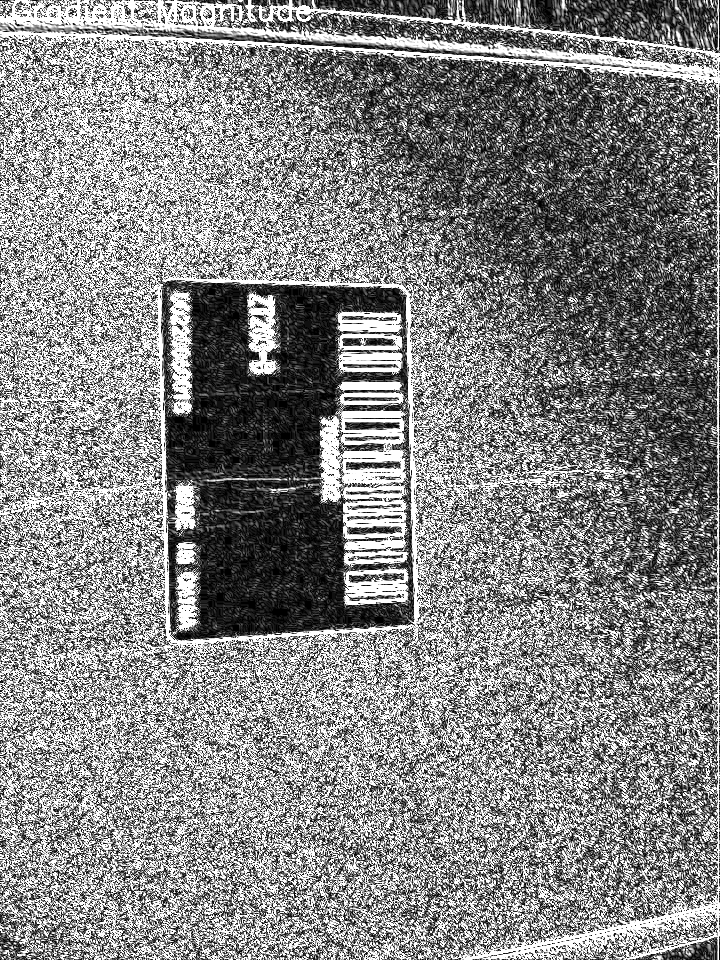

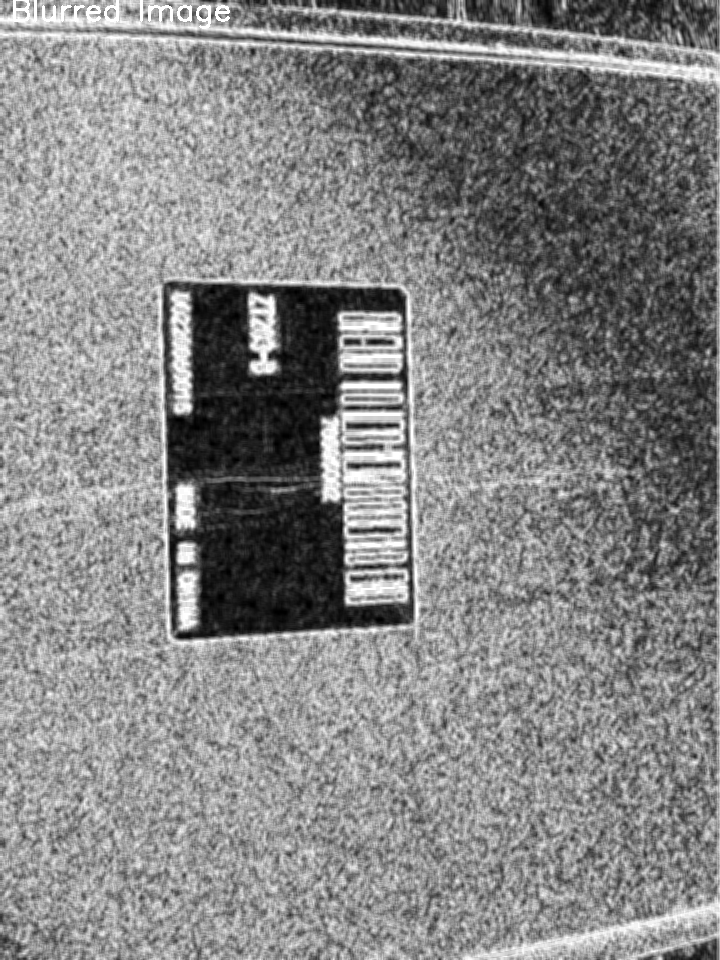

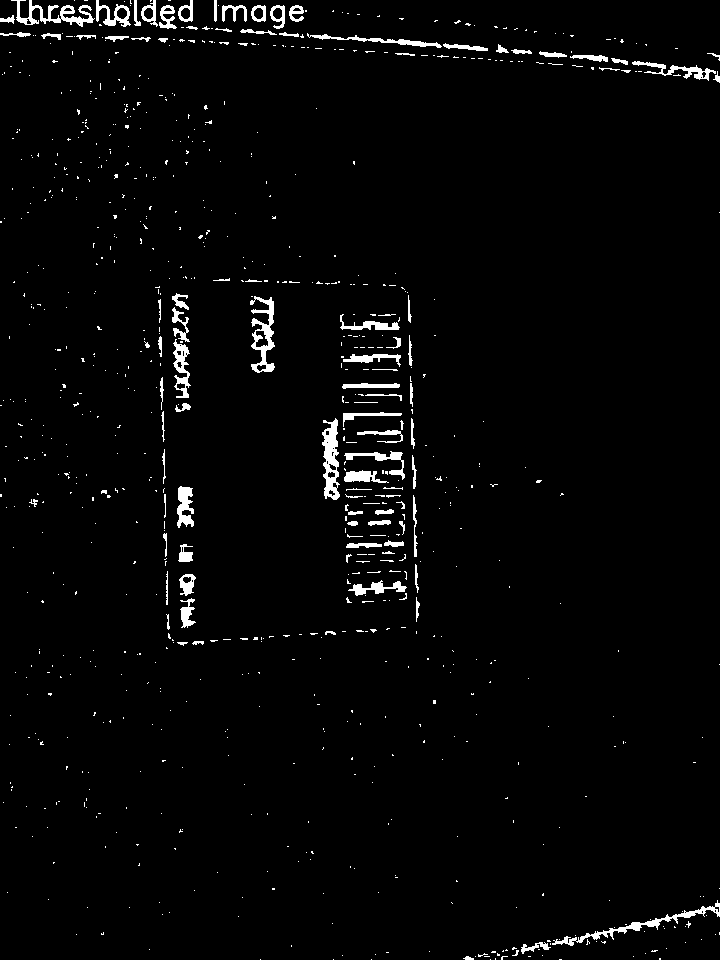

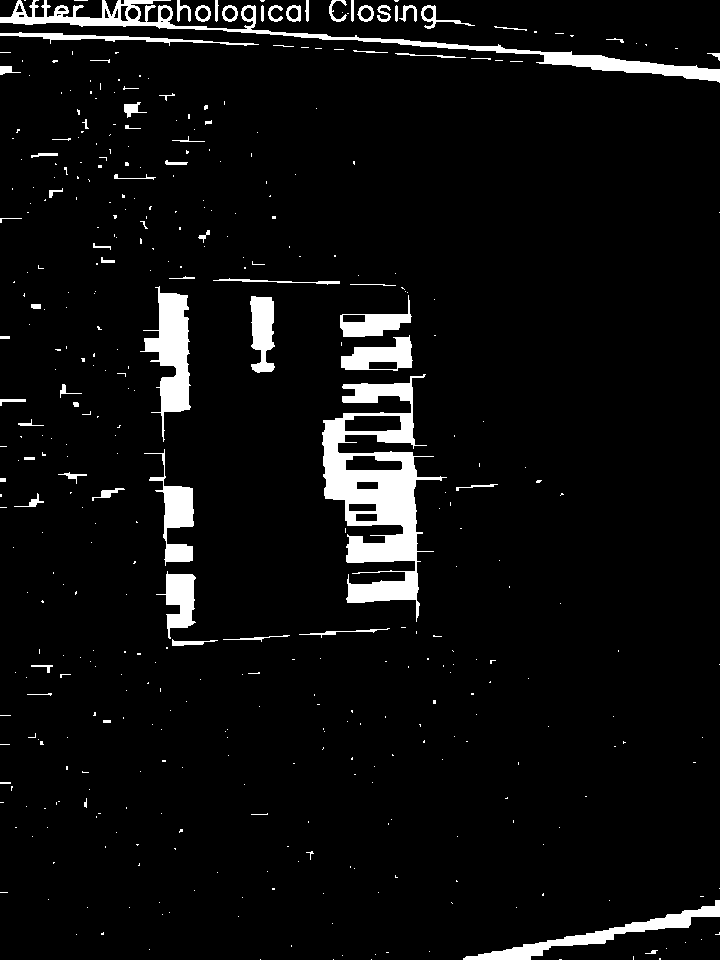

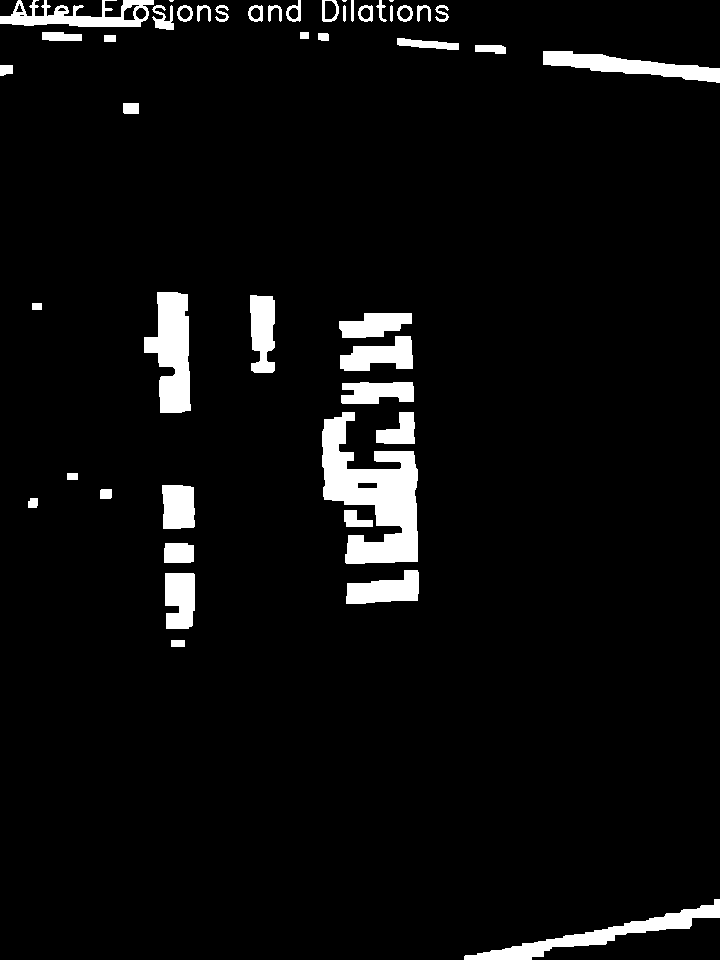

<ipython-input-3-ed49ae53b13d>:59: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)


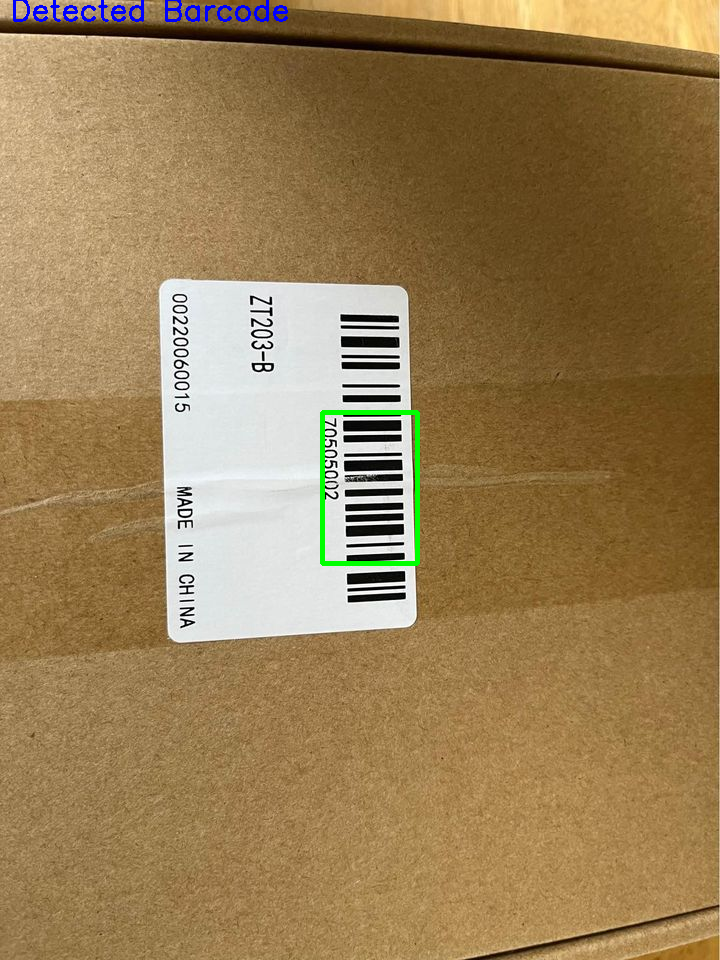

In [ ]:
# Import the necessary packages
from google.colab import drive
drive.mount('/content/drive')
import numpy as np
import imutils
import cv2
from google.colab.patches import cv2_imshow

def display_image_with_title(image, title):
    # Display an image with a title written on it
    output = image.copy()
    cv2.putText(output, title, (10, 20), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    cv2_imshow(output)

# Load the image and convert it to grayscale
image_path = "/content/drive/MyDrive/DIP project/image.jpg"
image = cv2.imread(image_path)
display_image_with_title(image, "Original Image")
if image is None:
    print("Error: Image not found.")
else:
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    display_image_with_title(gray, "Grayscale Image")

    # Compute the Scharr gradient magnitude representation of the images
    ddepth = cv2.cv.CV_32F if imutils.is_cv2() else cv2.CV_32F
    gradX = cv2.Sobel(gray, ddepth=ddepth, dx=1, dy=0, ksize=-1)
    gradY = cv2.Sobel(gray, ddepth=ddepth, dx=0, dy=1, ksize=-1)

    # Subtract the y-gradient from the x-gradient
    gradient = cv2.subtract(gradX, gradY)
    gradient = cv2.convertScaleAbs(gradient)
    display_image_with_title(gradient, "Gradient Magnitude")

    # Blur and threshold the image
    blurred = cv2.blur(gradient, (4, 5))
    display_image_with_title(blurred, "Blurred Image")
    _, thresh = cv2.threshold(blurred, 225, 255, cv2.THRESH_BINARY)
    display_image_with_title(thresh, "Thresholded Image")

    # Construct a closing kernel and apply it to the thresholded image
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (21, 7))
    closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
    display_image_with_title(closed, "After Morphological Closing")

    # Perform a series of erosions and dilations
    closed = cv2.erode(closed, None, iterations=2)
    closed = cv2.dilate(closed, None, iterations=3)
    display_image_with_title(closed, "After Erosions and Dilations")

    # Find the contours in the thresholded image, then sort the contours
    cnts = cv2.findContours(closed.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = sorted(cnts, key=cv2.contourArea, reverse=True)[0]

    # Compute the rotated bounding box of the largest contour
    rect = cv2.minAreaRect(c)
    box = cv2.cv.BoxPoints(rect) if imutils.is_cv2() else cv2.boxPoints(rect)
    box = np.int0(box)

    # Draw a bounding box around the detected barcode and display the image
    cv2.drawContours(image, [box], 0, (0, 255, 0), 3)
    display_image_with_title(image, "Detected Barcode")


In [ ]:
!pip install pyzbar

In [ ]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Navigate to the directory containing your script
os.chdir('/content/drive/MyDrive/')

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from fastai.vision.all import *
path = Path('/content/drive/MyDrive/Barcode dataset')
path.ls()

(#2) [Path('/content/drive/MyDrive/Barcode dataset/1'),Path('/content/drive/MyDrive/Barcode dataset/0')]

In [ ]:
zeros = (path/'0').ls()
ones = (path/'1').ls()


In [ ]:
zeros[:6], ones [:6]

((#6) [Path('/content/drive/MyDrive/Barcode dataset/0/20201211_102_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/0/20201211_1022_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/0/20201211_102_rgb.txt'),Path('/content/drive/MyDrive/Barcode dataset/0/20201211_101_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/0/20201211_101_rgb.txt'),Path('/content/drive/MyDrive/Barcode dataset/0/20201211_1024_rgb.txt')],
 (#6) [Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2049_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2048_rgb.txt'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2045_rgb.txt'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2041_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2046_rgb.txt'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2042_rgb.png')])

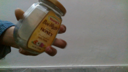

In [ ]:
im =  Image.open(zeros[0])
im.to_thumb(128,128)

In [ ]:
import re

def get_y(ypath):
    return re.findall("/\d.", ypath)[0]

get_y('../input/barcode-detection-annotated-dataset/1/20201211_100_rgb.png')

'/1/'

In [ ]:
get_image_files(path)


(#1034) [Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2049_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2041_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2042_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2045_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2073_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2077_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2072_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2079_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2078_rgb.png'),Path('/content/drive/MyDrive/Barcode dataset/1/20201211_2069_rgb.png')...]

In [ ]:
codes = DataBlock(blocks = (ImageBlock, CategoryBlock),
                  get_items = get_image_files,
                  splitter = RandomSplitter(seed=42),
                  get_y = parent_label,
                  item_tfms = Resize(460),
                  batch_tfms = aug_transforms(size=224, min_scale=0.75)
                  )
dls = codes.dataloaders(path)

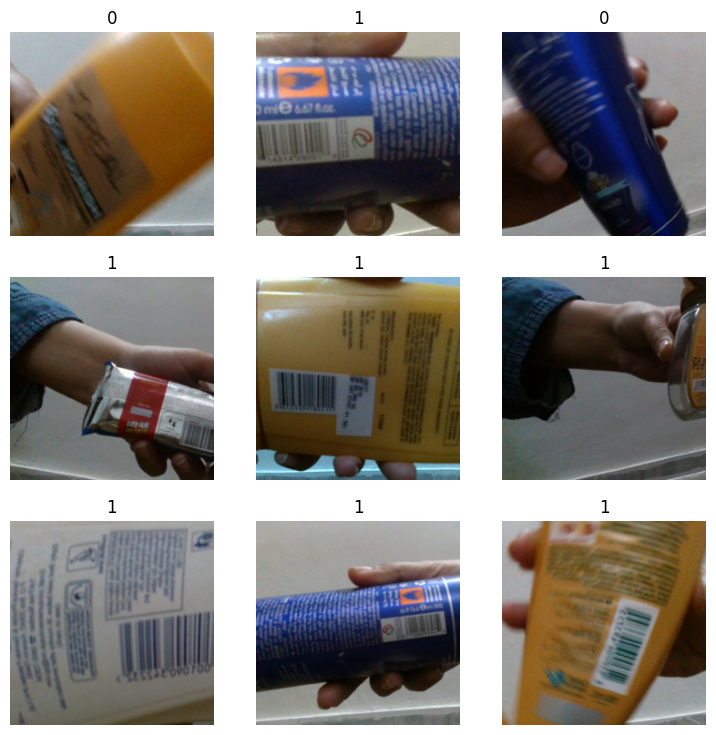

In [ ]:
dls.show_batch()

/usr/local/lib/python3.10/dist-packages/fastai/vision/learner.py:301: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 143MB/s]


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


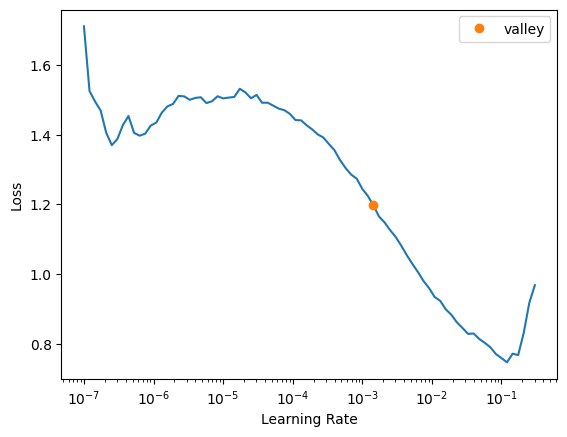

In [ ]:
#learn = cnn_learner(dls, resnet34, metrics=error_rate)
#lr_min, lr_steep = learn.lr_find()
learn = cnn_learner(dls, resnet34, metrics=error_rate)
lr_val = learn.lr_find()  # Assuming lr_find() returns a single value

# Use lr_val as needed in your code


In [ ]:
from fastai.vision.all import cnn_learner, ImageDataLoaders, untar_data, URLs, error_rate
print(type(learn))


<class 'fastai.learner.Learner'>


In [ ]:
# Once lr_find() has been called, you can access the attributes lr_min and lr_steep
#print(f"Minimum/10: {learn.lr_min:.2e}, steepest point: {learn.lr_steep:.2e}")
# Access the lr_min and lr_steep attributes from the Learner object

#print(f"Minimum/10: {lr_val.lr_min:.2e}, steepest point: {lr_val.lr_steep:.2e}")
# Access the learning rate values for minimum loss and steepest point from the Recorder
# Run lr_find() to find the learning rate

#lr_min, lr_steep = learn.recorder.min_grad_lr, learn.recorder.lr_steep
#print(f"Minimum/10: {lr_min:.2e}, steepest point: {lr_steep:.2e}")
# Access the learning rate values for minimum loss and steepest point from the Recorder
lr_val = learn.recorder.lrs
losses = learn.recorder.losses

# Find the index corresponding to the minimum loss and the steepest point
min_loss_idx = losses.index(min(losses))
steep_lr_idx = losses.index(max(losses[:min_loss_idx]))

# Get the learning rates for minimum loss and steepest point
lr_min = lr_val[min_loss_idx]
lr_steep = lr_val[steep_lr_idx]

print(f"Minimum/10: {lr_min:.2e}, steepest point: {lr_steep:.2e}")


Minimum/10: 1.20e-01, steepest point: 1.00e-07


In [ ]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(2, 1e-3)

epoch,train_loss,valid_loss,error_rate,time
0,0.962022,0.260140,0.087379,06:48


epoch,train_loss,valid_loss,error_rate,time
0,0.412122,0.132914,0.043689,08:35
1,0.302300,0.040997,0.009709,08:28


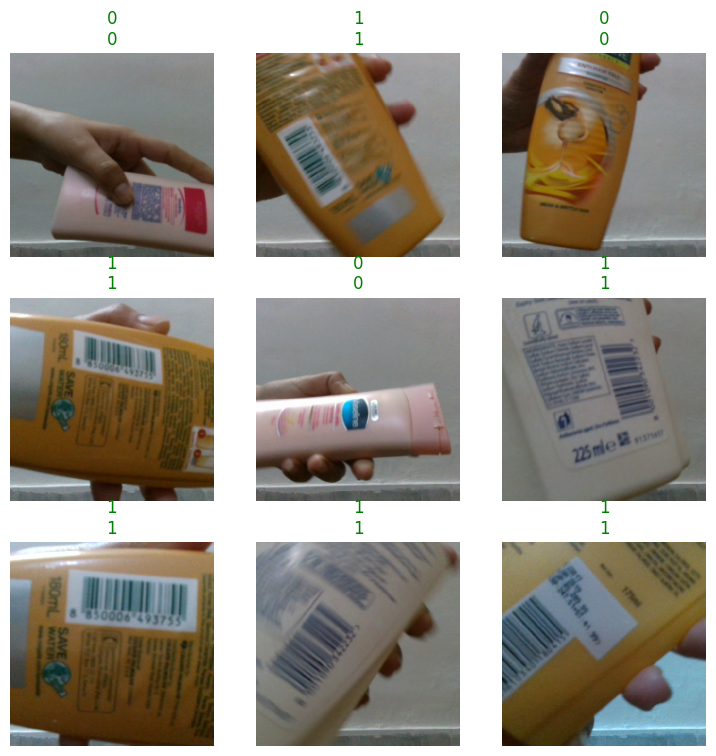

In [ ]:
learn.show_results()